In [14]:
%load_ext autoreload
# to make modification in .py file type %autoreload

%load_ext line_profiler
#for finding out how long code takes to run
#an example of how to get diagnostics on functions
#%lprun -f ff.generate_map_full ff.generate_map_full(384, A_BB, alpha_BB, beta_sigma, freqs, nu0)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler


In [15]:
%autoreload

In [16]:
import sys
sys.path.append('../../') #takes us to the directory named foreground_functions that housed the foreground_function.py 
#and the w3j.npy files


#------packages-------------------
%pylab inline
import time
import healpy as hp
import matplotlib.pyplot as plt
import foreground_functions as ff
from scipy.optimize import curve_fit, minimize

Populating the interactive namespace from numpy and matplotlib


# parameters for generating map

In [24]:
params_s = [1.4, -0.52, -3.1, -2.5]
A_s, alpha_s, beta_s, gamma_s = params_s
params_d = [5.0, -0.38, 1.6, -3.5] #look at https://arxiv.org/pdf/1405.0874.pdf for parameters potentially, as well as BICEP
A_d, alpha_d, beta_d, gamma_d = params_d

params = params_s + params_d

nside=128
ells = np.arange(384)
freqs = np.linspace(30, 300, 20)*1.e9

In [25]:
synch_amp_map = ff.map_amp(ells, [A_s, alpha_s])
dust_amp_map = ff.map_amp(ells, [A_d, alpha_d])

In [26]:
synch_pcls = hp.anafast(synch_amp_map)
dust_pcls = hp.anafast(dust_amp_map)

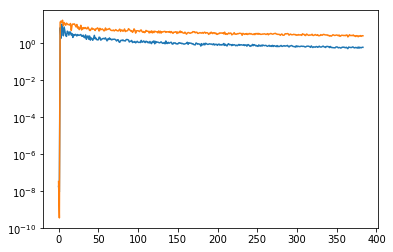

In [27]:
semilogy(synch_pcls)
semilogy(dust_pcls)

In [28]:
synch_beta_map = ff.map_beta(ells, [beta_s, gamma_s])
dust_beta_map = ff.map_beta(ells, [beta_d, gamma_d])

In [29]:
synch_bcls = hp.anafast(synch_beta_map)
dust_bcls = hp.anafast(dust_beta_map)

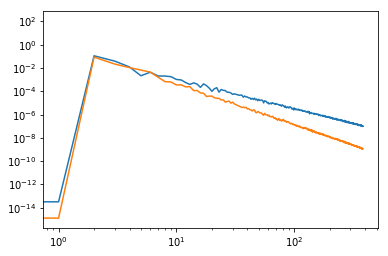

In [30]:
loglog(synch_bcls)
loglog(dust_bcls)

In [31]:
full_synch = ff.map_synch(ells, freqs, params_s)
full_dust = ff.map_dust(ells, freqs, params_d)

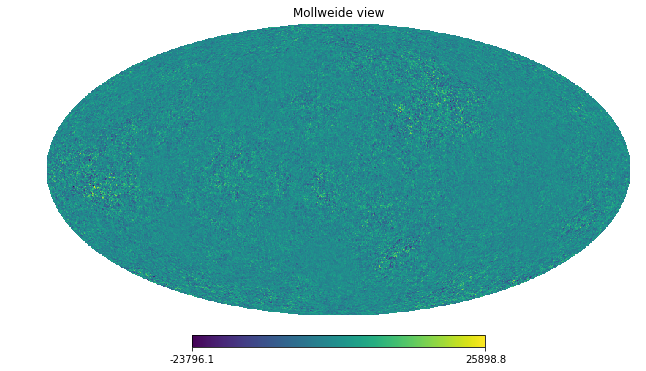

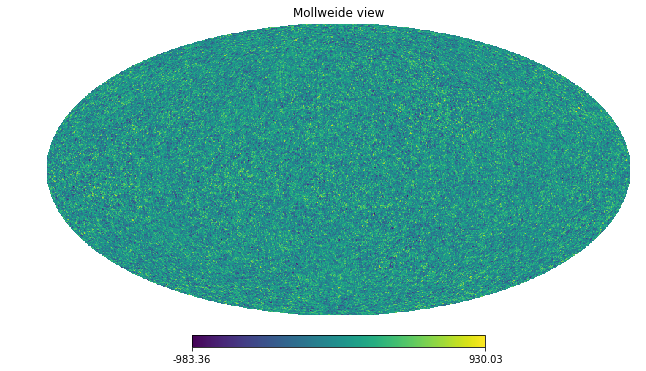

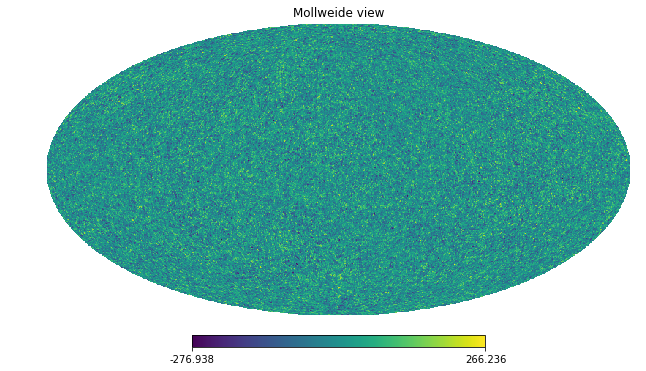

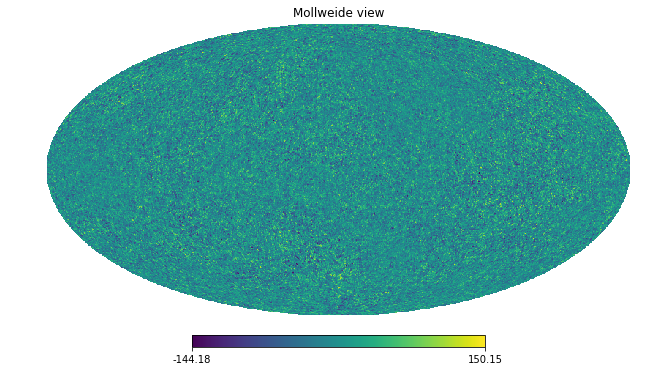

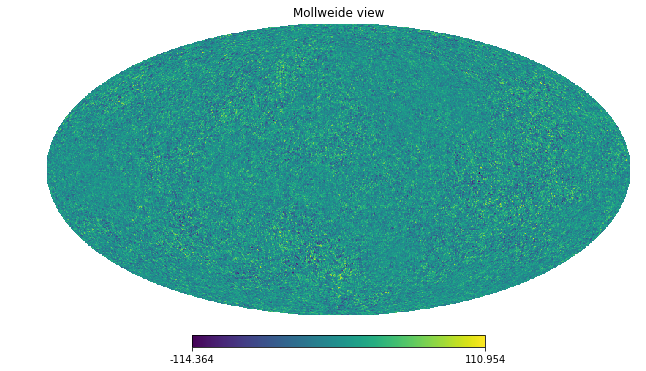

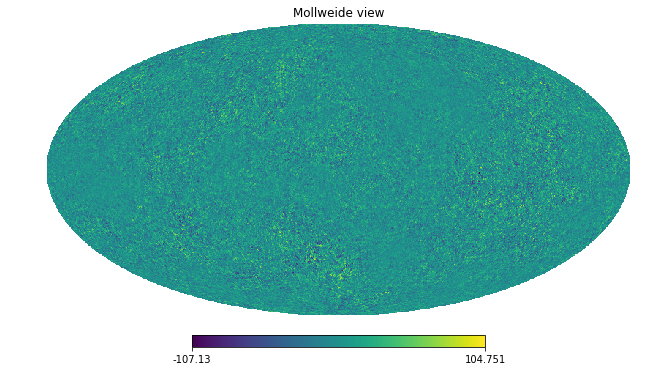

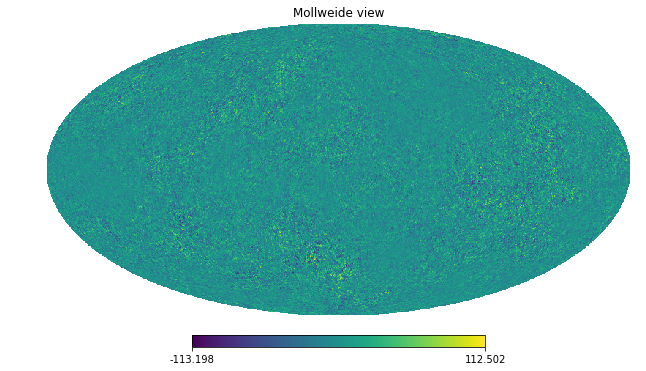

In [32]:
for i in range(len(freqs)):
    if i%3==0:
        hp.mollview(full_synch[i])

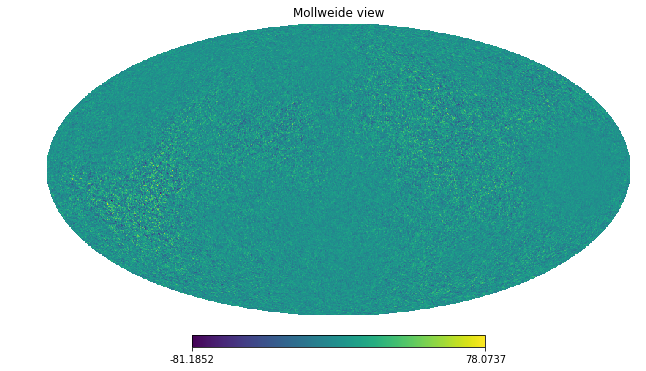

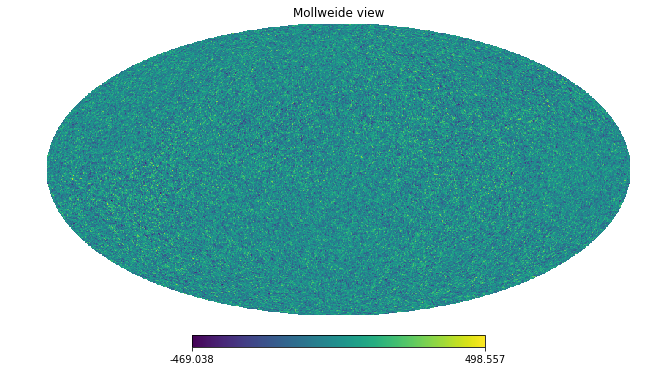

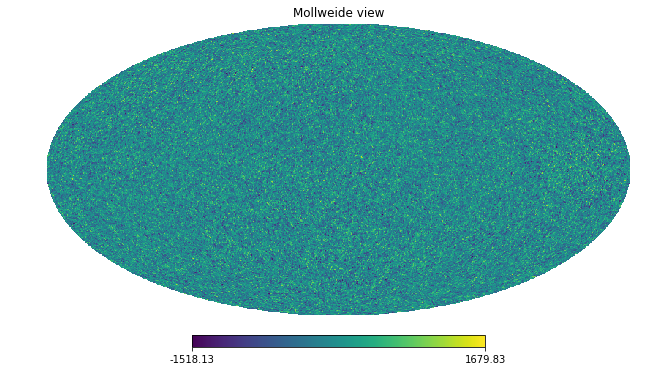

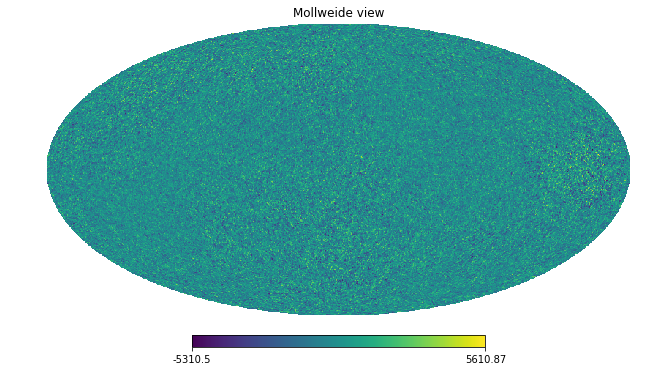

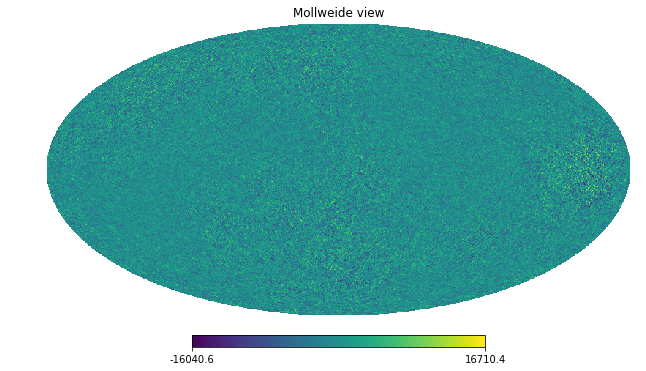

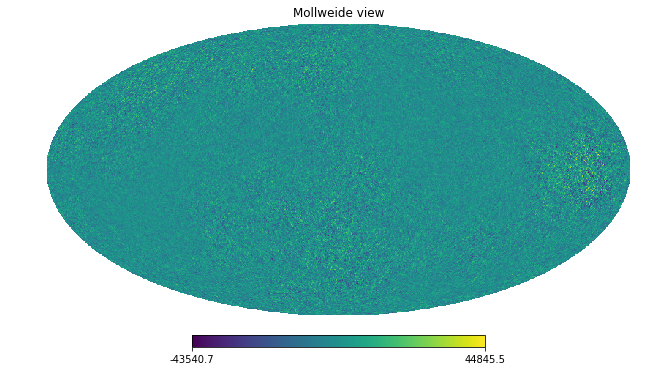

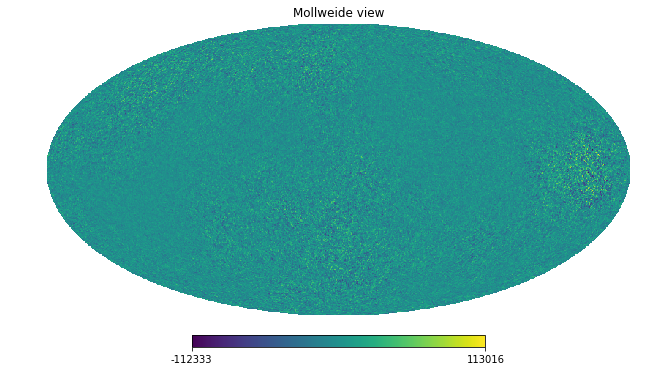

In [33]:
for i in range(len(freqs)):
    if i%3==0:
        hp.mollview(full_dust[i])

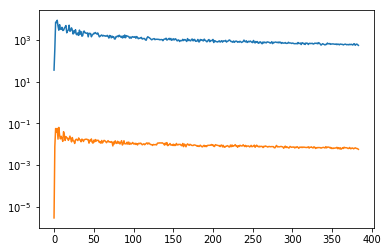

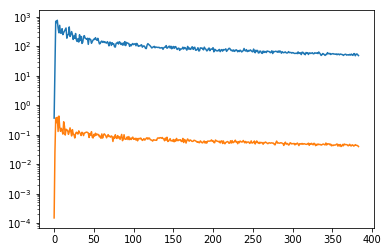

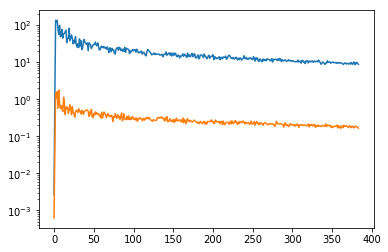

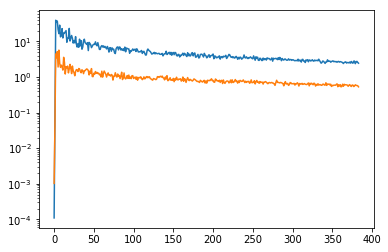

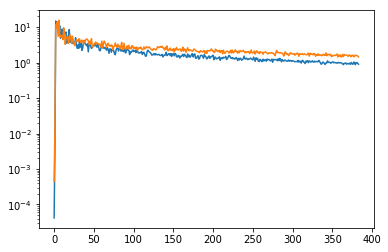

...

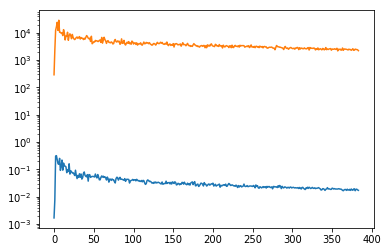

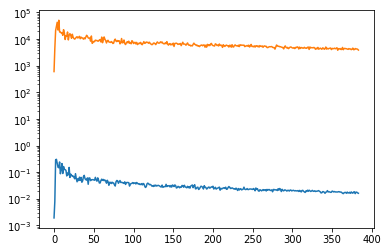

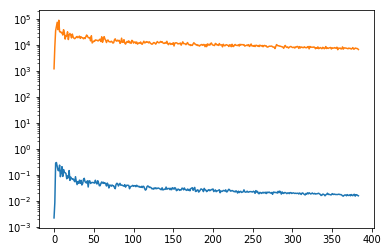

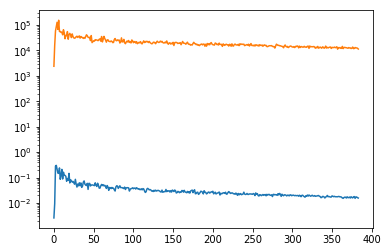

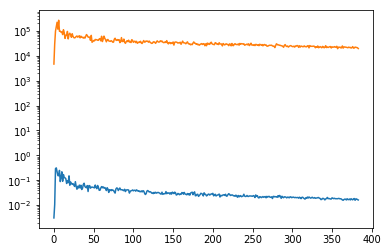

In [35]:
for i in range(len(freqs)):
    figure()
    semilogy(hp.anafast(full_synch[i]))
    semilogy(hp.anafast(full_dust[i]))

In [36]:
full_fg = full_synch + full_dust

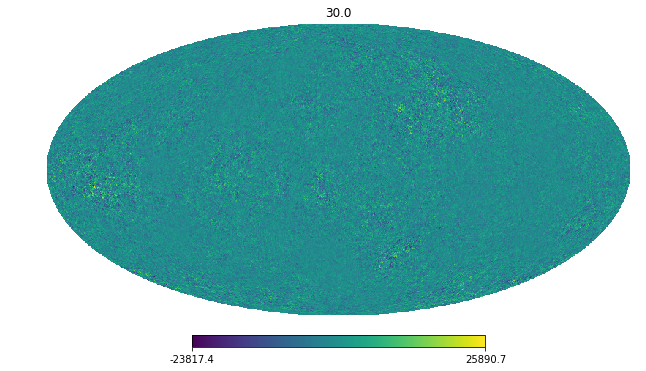

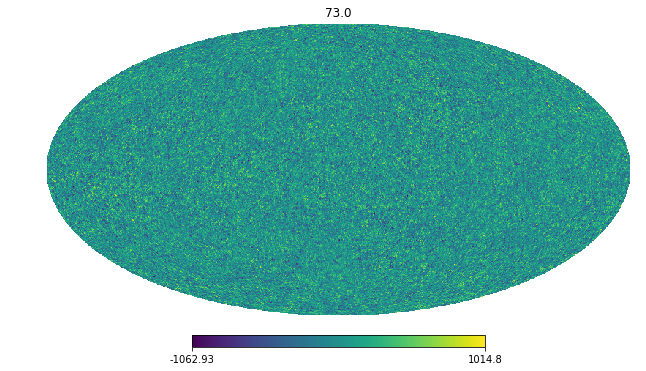

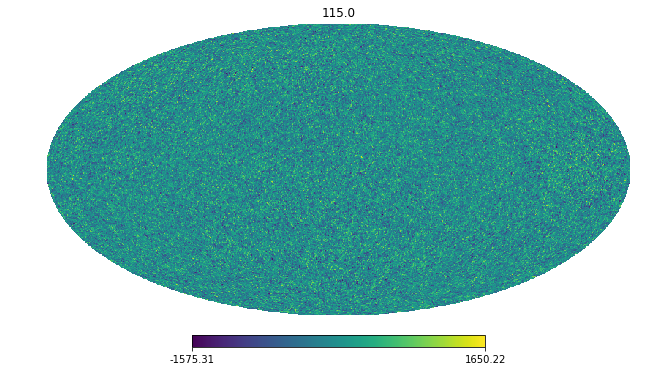

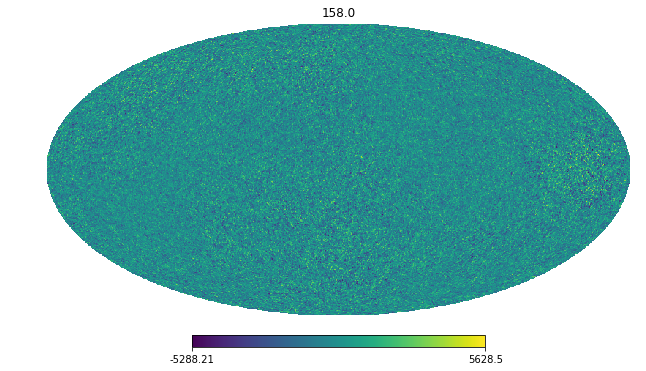

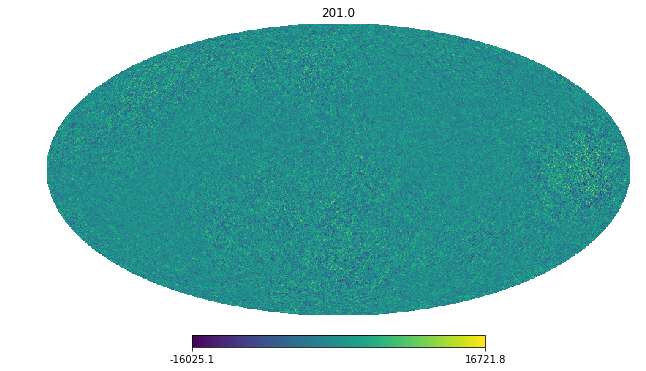

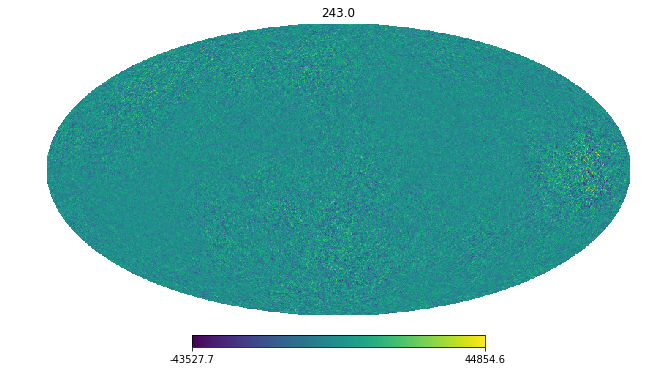

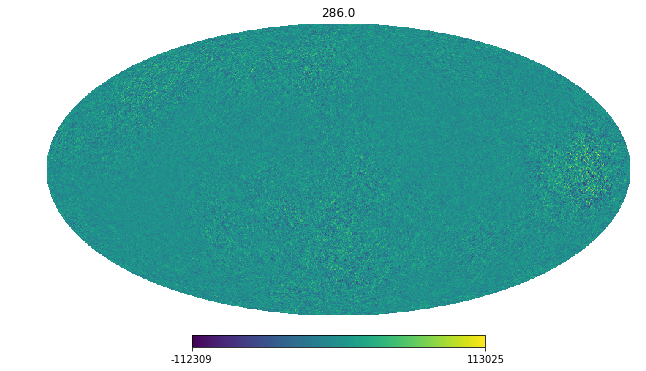

In [37]:
for i in range(len(freqs)):
    if i%3==0:
        hp.mollview(full_fg[i], title=str(np.round(1e-9*freqs[i])))

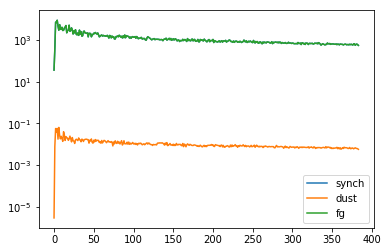

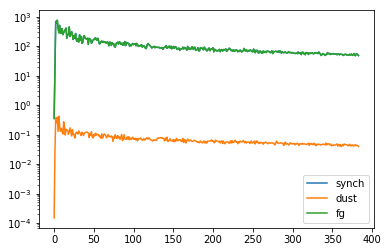

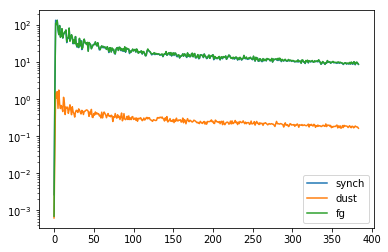

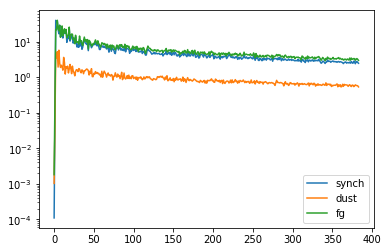

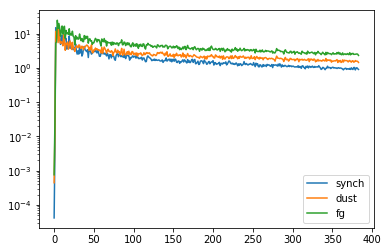

...

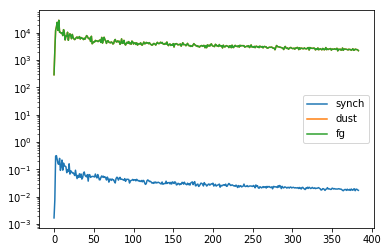

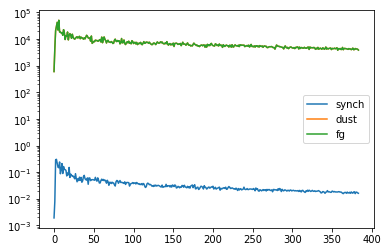

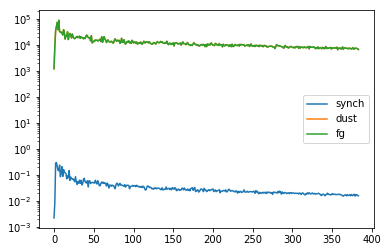

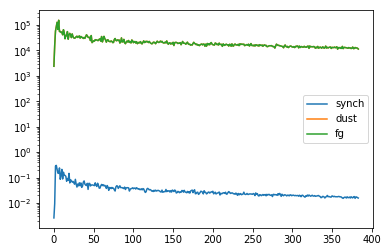

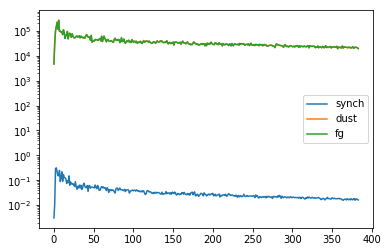

In [38]:
for i in range(len(freqs)):
    figure()
    semilogy(hp.anafast(full_synch[i]), label='synch')
    semilogy(hp.anafast(full_dust[i]), label='dust')
    semilogy(hp.anafast(full_fg[i]), label='fg')
    legend()

In [39]:
start=time.time()
model_s = ff.model_synch(ells, freqs, params_s)
model_d = ff.model_dust(ells, freqs, params_d)
model_fg = ff.model_fg(ells, freqs, params)
print(time.time()-start)

0.20582890510559082


In [40]:
%timeit ff.model_fg(ells, freqs, params)

89 ms ± 8.04 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


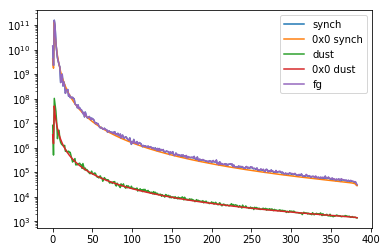

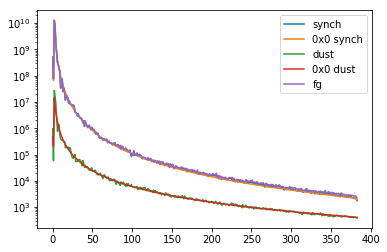

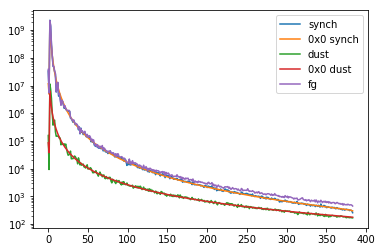

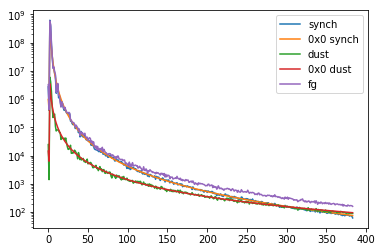

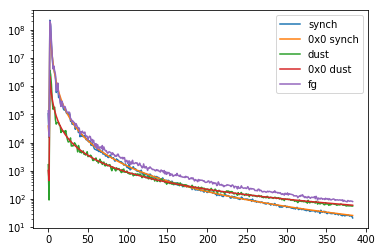

...

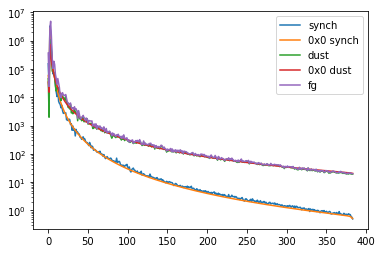

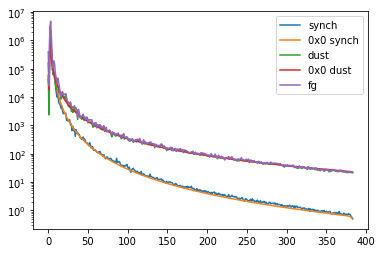

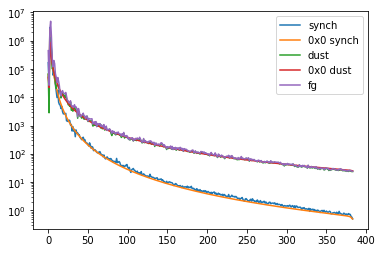

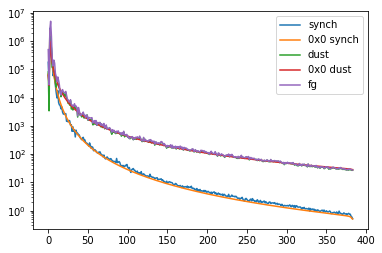

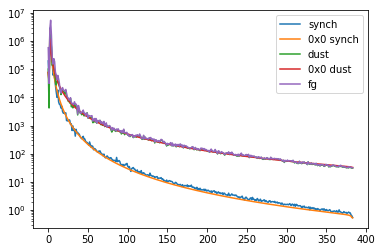

In [212]:
for i in range(len(freqs)):
    figure()
    semilogy(hp.anafast(full_synch[i]), label='synch')
    semilogy(model_s[i], label='0x0 synch')
    semilogy(hp.anafast(full_dust[i]), label='dust')
    semilogy(model_d[i], label='0x0 dust')
    semilogy(hp.anafast(full_fg[i]), label='fg')
    legend()

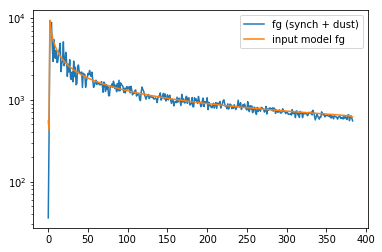

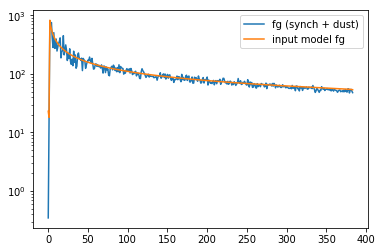

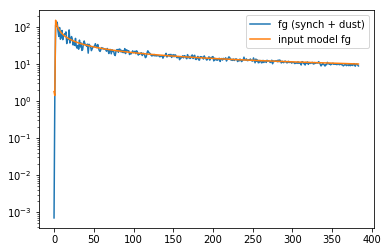

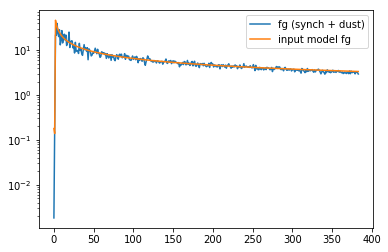

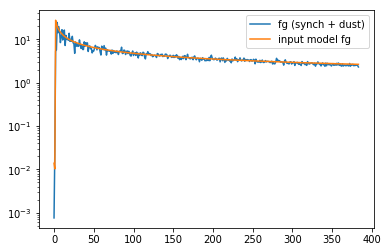

...

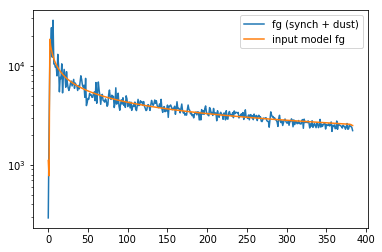

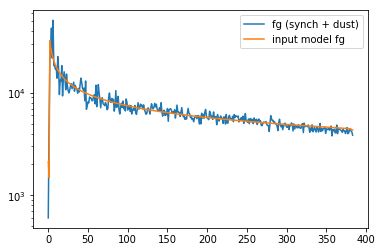

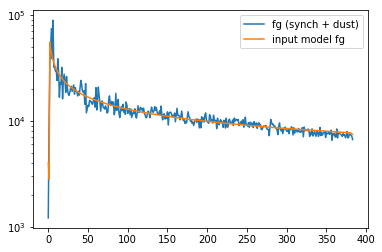

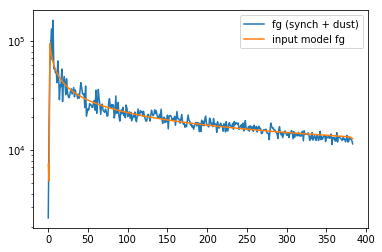

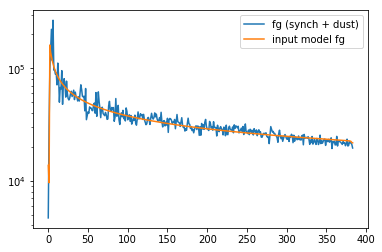

In [41]:
for i in range(len(freqs)):
    figure()
    semilogy(hp.anafast(full_fg[i]), label='fg (synch + dust)')
    semilogy(model_fg[i], label='input model fg')
    legend()

In [24]:
%autoreload

In [42]:
sed_s = ff.scale_synch(freqs, beta_s)
sed_d = ff.scale_dust(freqs, beta_d)
unscale_d = ff.normed_dust(freqs, beta_d)

In [43]:
sed_s.shape
sed_d.shape

(20,)

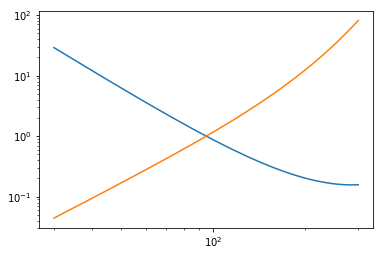

In [46]:
loglog(freqs*1e-9, sed_s)
loglog(freqs*1e-9, sed_d)
# loglog(freqs, unscale_d)

In [121]:
%autoreload

In [82]:
synch_sed = ff.scale_synch(freqs, beta_s)

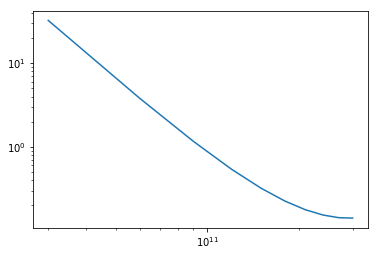

In [85]:
loglog(freqs, synch_sed)

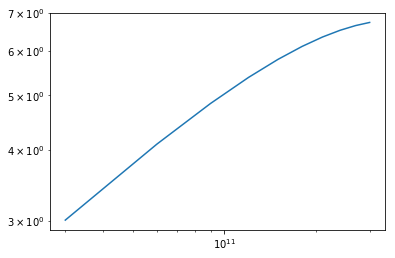

In [95]:
unscaled_dust = ff.normed_dust(freqs, beta_d)
loglog(freqs, unscaled_dust)

In [153]:
%autoreload

In [49]:
data = ff.ps_data_fg(ells, freqs, params)

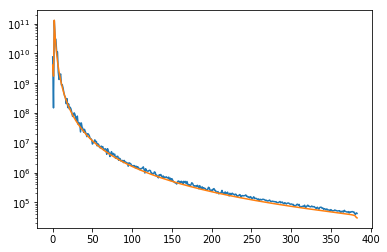

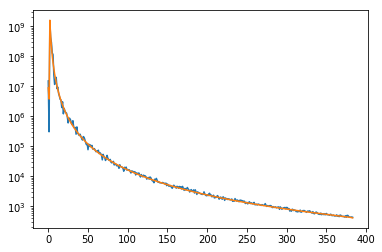

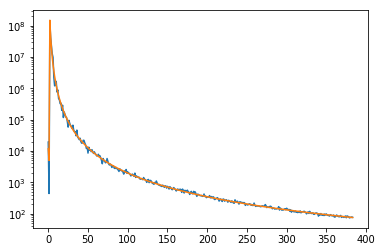

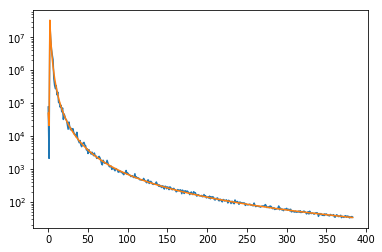

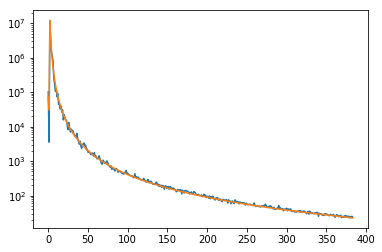

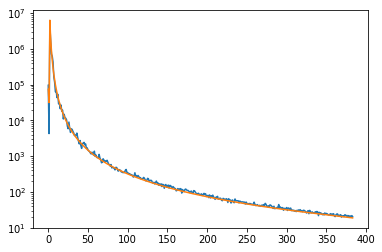

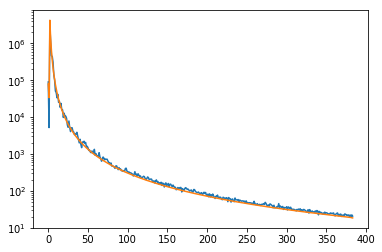

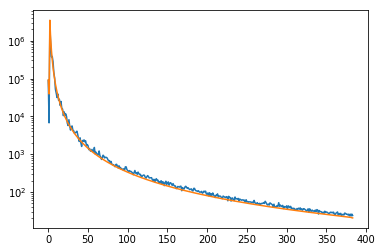

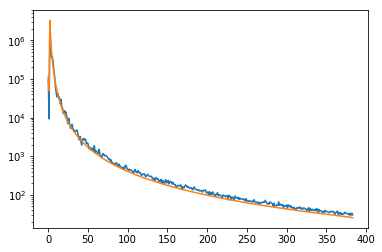

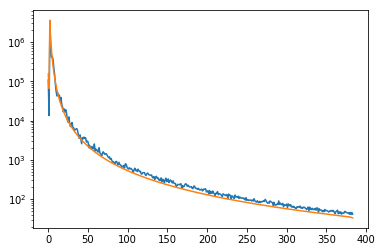

In [157]:
for i in range(len(freqs)):
    figure()
    semilogy(data[i])
    semilogy(model_fg[i])

In [147]:
%timeit ff.model_fg(ells, freqs, params)

80.1 ms ± 1.32 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [50]:
initial = [1.e3,-1.,-1.,-3.,1.e3,-1.,-1.,-3.]

In [51]:
start=time.time()
result0 = minimize(ff.chi2_fg, initial, args=(ells, freqs, data), method='L-BFGS-B', 
                   bounds=((None, None), (None, None), (None, None), (None, -2.01),
                           (None, None), (None, None), (None, None), (None, -2.01)))
print(time.time()-start)
print(result0)

101.80057311058044
      fun: 7473.800177847048
 hess_inv: <8x8 LbfgsInvHessProduct with dtype=float64>
      jac: array([-0.00127329, -0.14024408, -0.17898856, -0.19381332, -0.01482476,
        0.04129106, -0.05657057,  0.33578544])
  message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 972
      nit: 90
   status: 0
  success: True
        x: array([ 4.89194188, -0.37221551,  2.49508937, -5.25820537,  1.31781315,
       -0.51031844, -4.04208561, -3.730854  ])


In [52]:
x0 = result0.x
print(x0)
print(params)
print((x0-params)/x0*100)

[ 4.89194188 -0.37221551  2.49508937 -5.25820537  1.31781315 -0.51031844
 -4.04208561 -3.730854  ]
[1.4, -0.52, -3.1, -2.5, 5.0, -0.38, 1.6, -3.5]
[  71.38150792  -39.70401357  224.24404671   52.45526133 -279.41645893
   25.53668996  139.58352577    6.18769858]


In [53]:
fit0 = ff.model_fg(ells, freqs, x0)

In [55]:
print(ff.chi2_fg(params,ells, freqs, data))
print(ff.chi2_fg(x0, ells, freqs, data))

30058.230505013064
7473.800177847048


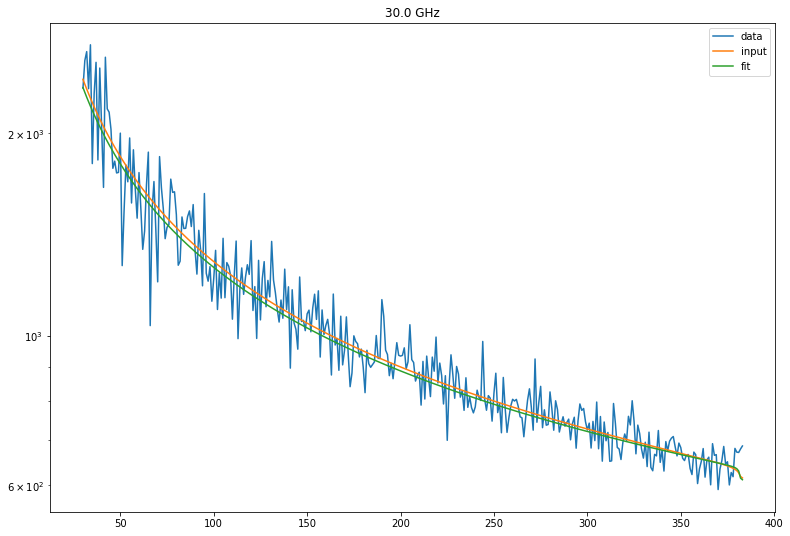

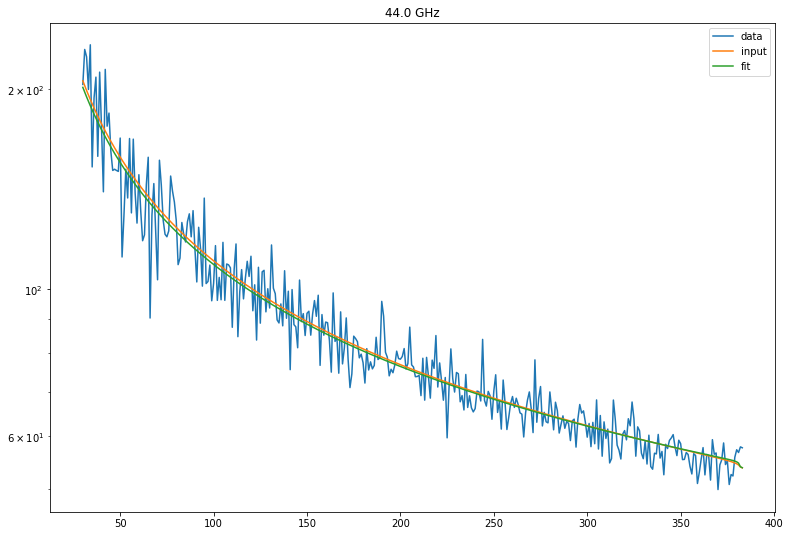

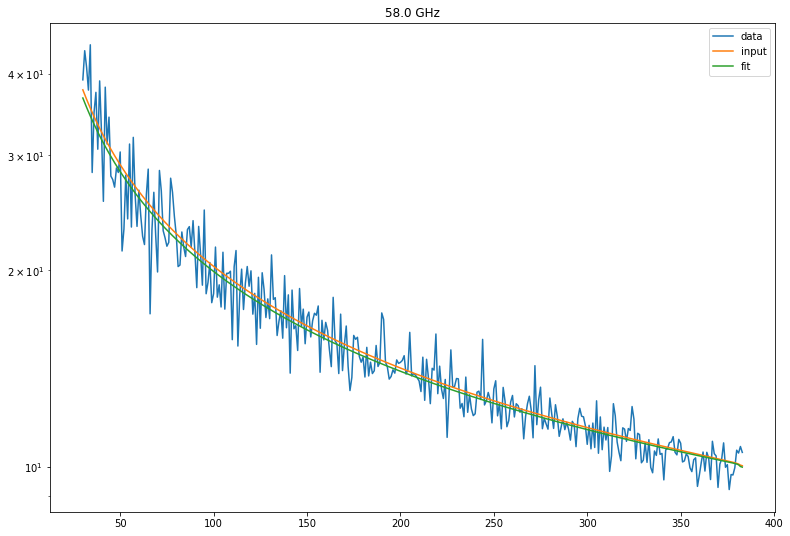

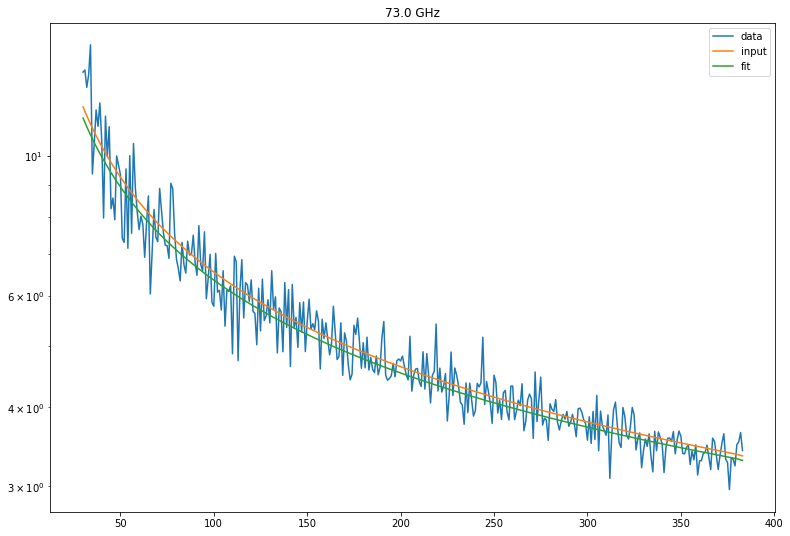

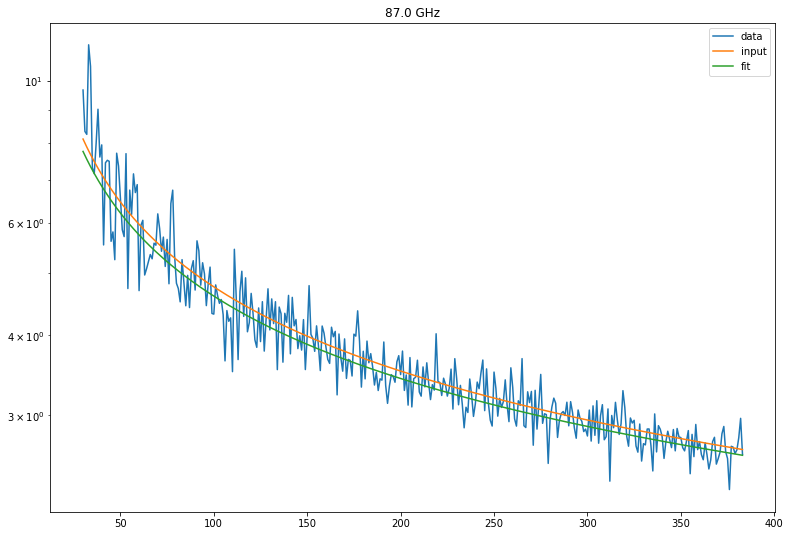

...

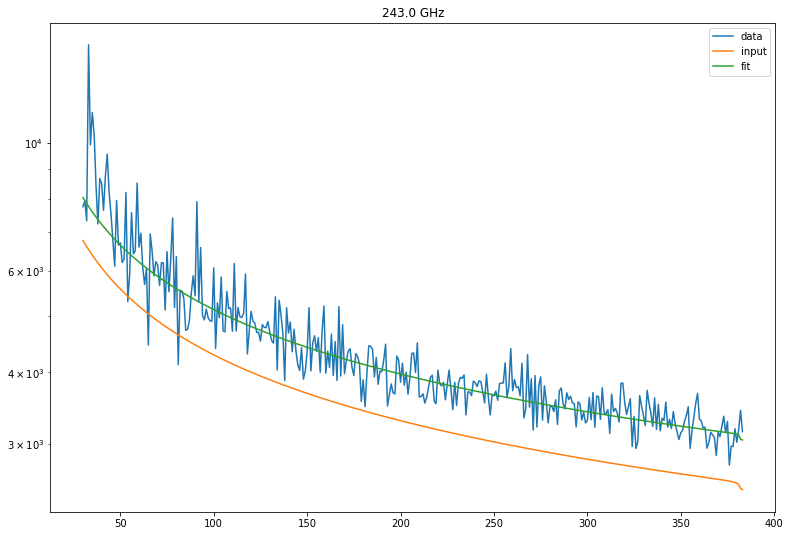

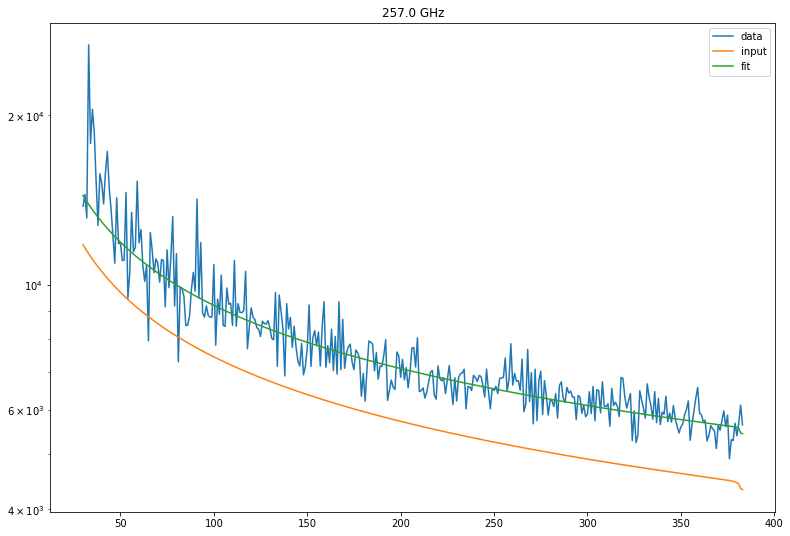

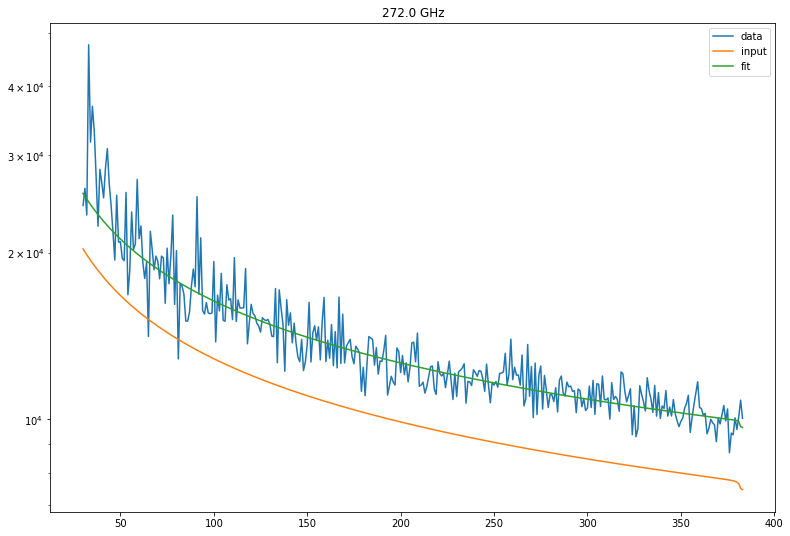

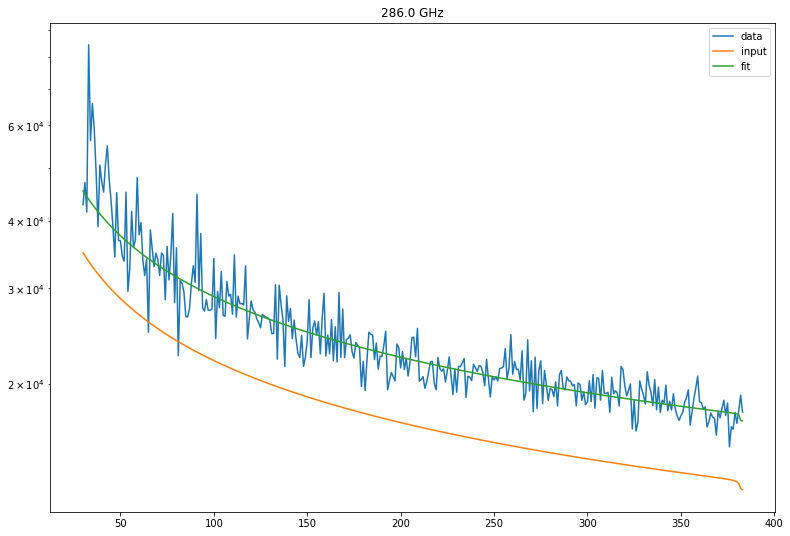

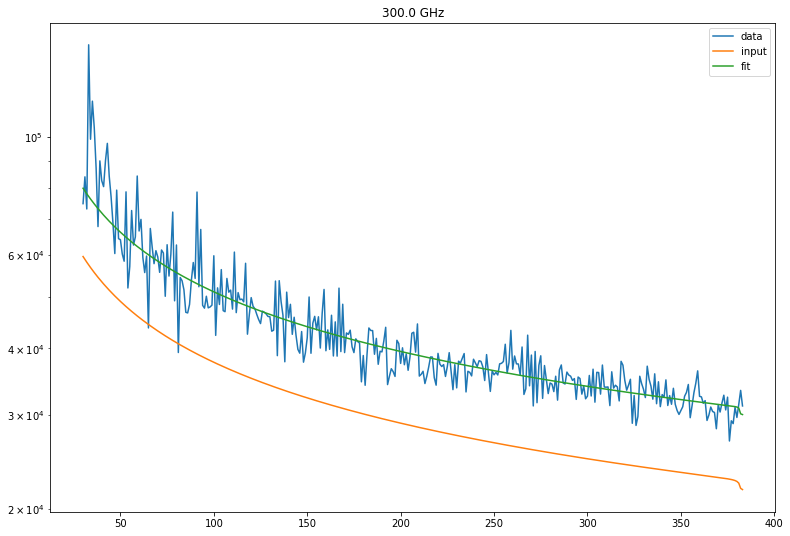

In [56]:
for i in range(len(freqs)):
    figure(figsize=(13,9))
    semilogy(ells[30:], data[i][30:], label='data')
    semilogy(ells[30:], model_fg[i][30:], label='input')
    semilogy(ells[30:], fit0[i][30:], label='fit')
    title(str(np.round(1e-9*freqs[i])) + ' GHz')
    legend()

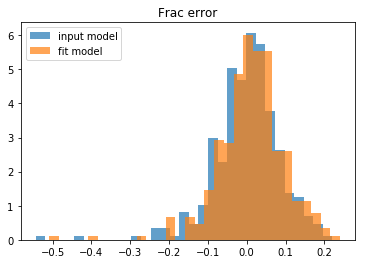

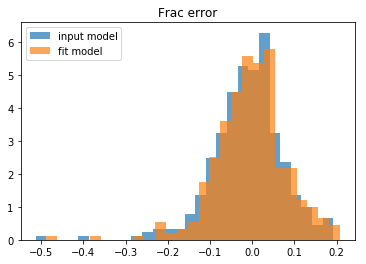

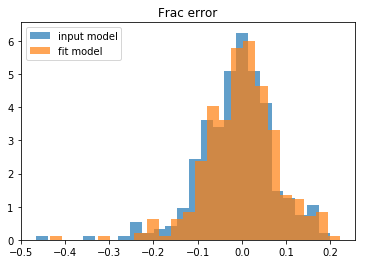

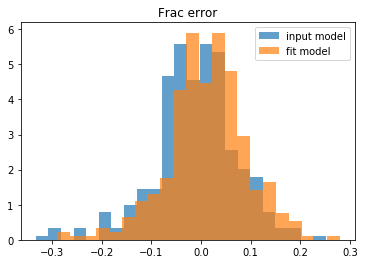

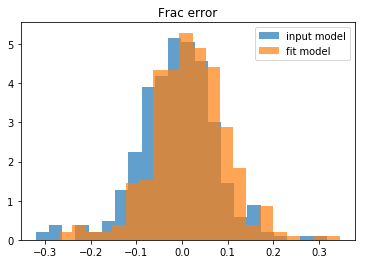

...

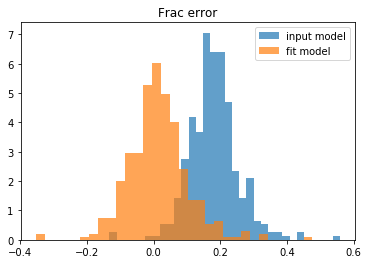

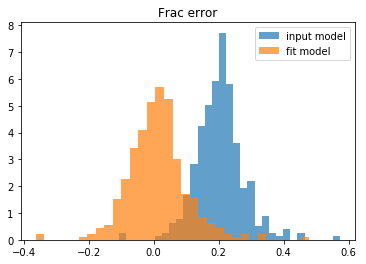

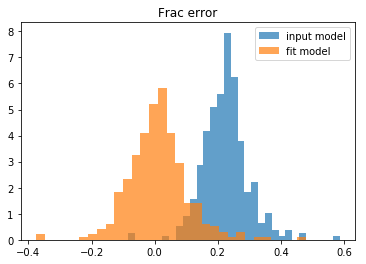

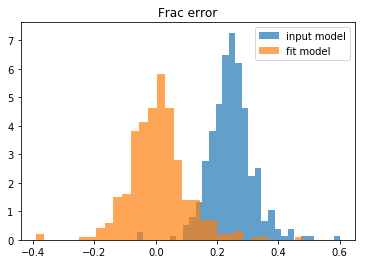

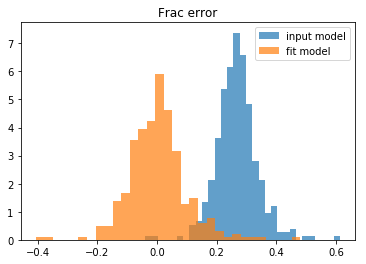

In [58]:
for i in range(len(freqs)):
    figure()
    hist((data[i][30:]-model_fg[i][30:])/data[i][30:], bins='auto', density=True, alpha=0.7, label='input model')
    hist((data[i][30:]-fit0[i][30:])/data[i][30:], bins='auto', density=True, alpha=0.7, label='fit model')
    title('Frac error')
    legend()

In [178]:
initial1 = [1.e3,-1.,-1.,-3.,3.e3,-1.,-1.,-3.]
#start closer to the correct amplitudes

In [179]:
start=time.time()
result1 = minimize(ff.chi2_fg, initial1, args=(ells, freqs, data), method='L-BFGS-B', 
                   bounds=((None, None), (None, None), (None, None), (None, -2.01),
                           (None, None), (None, None), (None, None), (None, -2.01)))
print(time.time()-start)
print(result1)

92.91362690925598
      fun: 10332.82677315224
 hess_inv: <8x8 LbfgsInvHessProduct with dtype=float64>
      jac: array([-8.36662366e+00,  1.10122062e+04,  5.12366896e+03, -2.07523235e+05,
       -1.95232133e+00,  5.73700781e+03, -1.14533523e+03, -8.68531060e+00])
  message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 1143
      nit: 87
   status: 0
  success: True
        x: array([ 1.10544527e+03, -2.35428097e+00, -2.86615721e+00, -2.01071677e+00,
        3.05845389e+03, -1.94618421e+00, -1.31682846e+00, -3.64155422e+00])


In [180]:
x1 = result1.x
print(x1)
print(params)
print((x1-params)/x1*100)

[ 1.10544527e+03 -2.35428097e+00 -2.86615721e+00 -2.01071677e+00
  3.05845389e+03 -1.94618421e+00 -1.31682846e+00 -3.64155422e+00]
[1700.0, -3.0, -3.2, -2.5, 4500.0, -2.0, -1.5, -3.5]
[-53.78418442 -27.42744111 -11.64774867 -24.33377155 -47.13316465
  -2.76519512 -13.91005345   3.88719241]


In [181]:
fit1 = ff.model_fg(ells, freqs, x1)

In [182]:
print(ff.chi2_fg(params,ells, freqs, data))
print(ff.chi2_fg(x0, ells, freqs, data))
print(ff.chi2_fg(x1, ells, freqs, data))

10592.118930996581
5667.077668134778
10332.82677315224


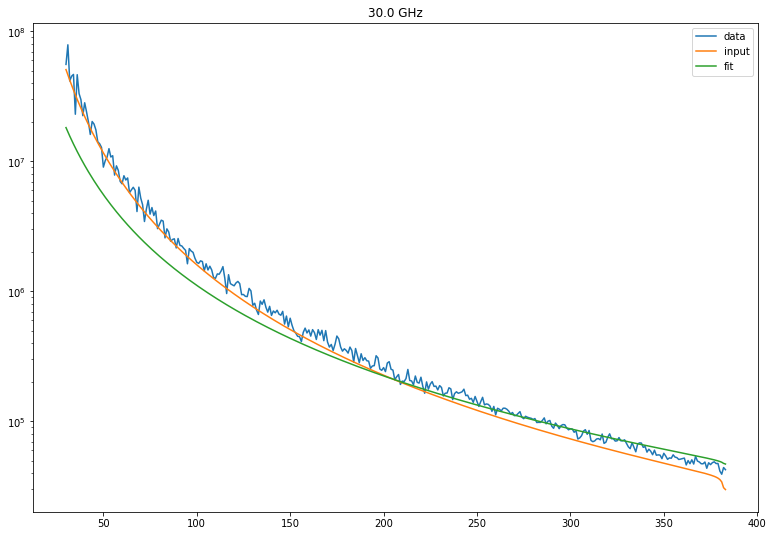

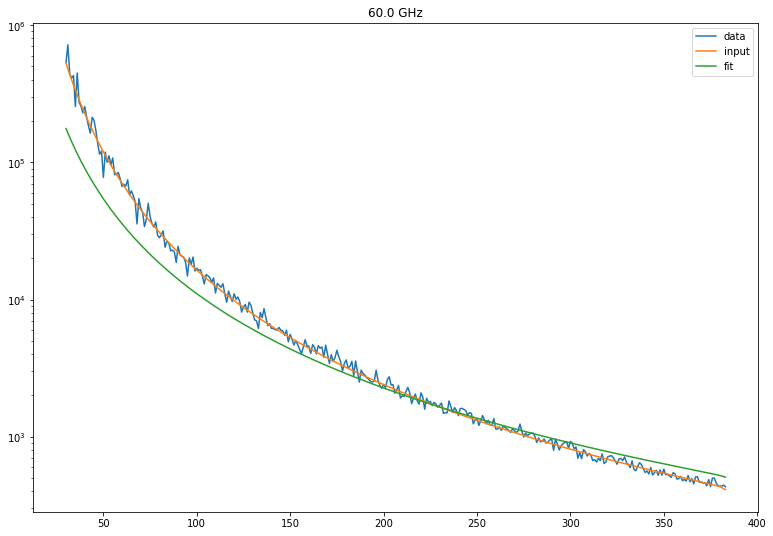

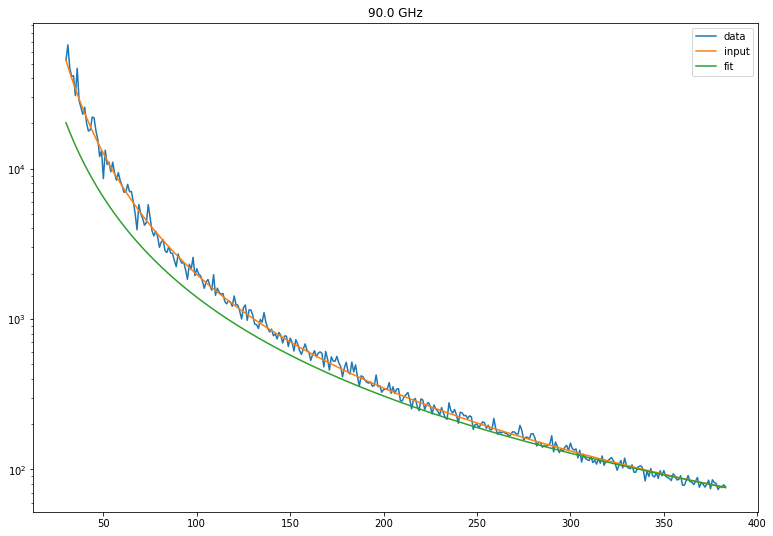

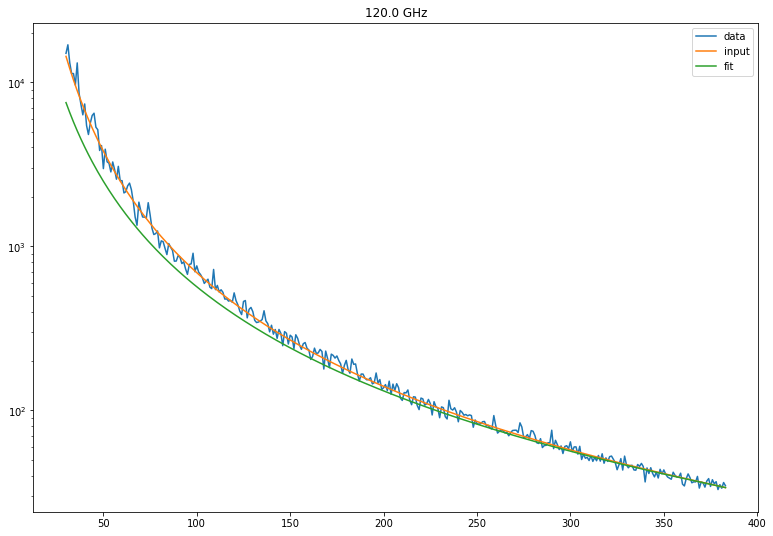

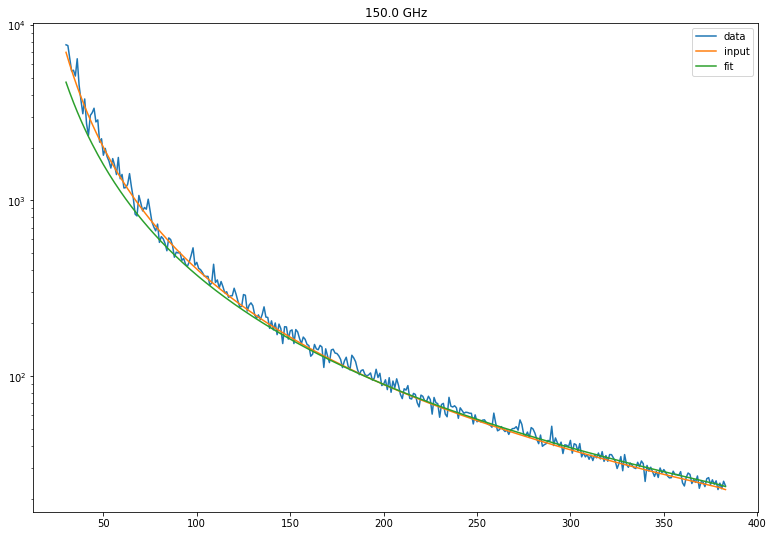

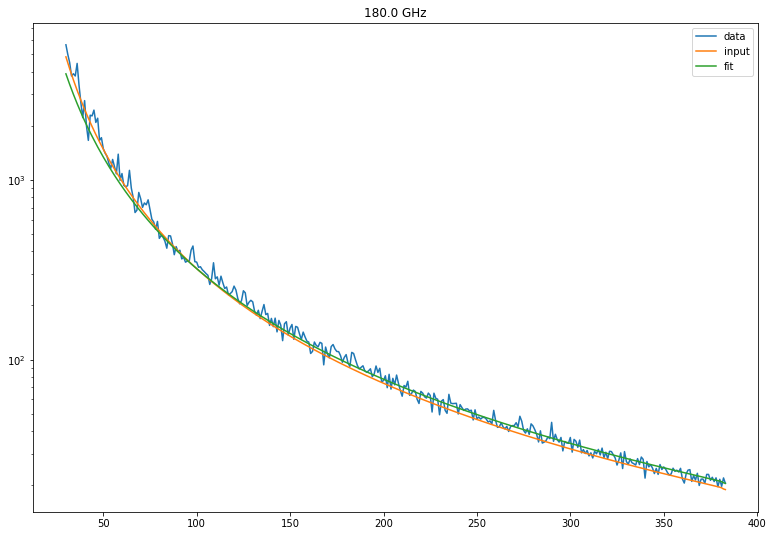

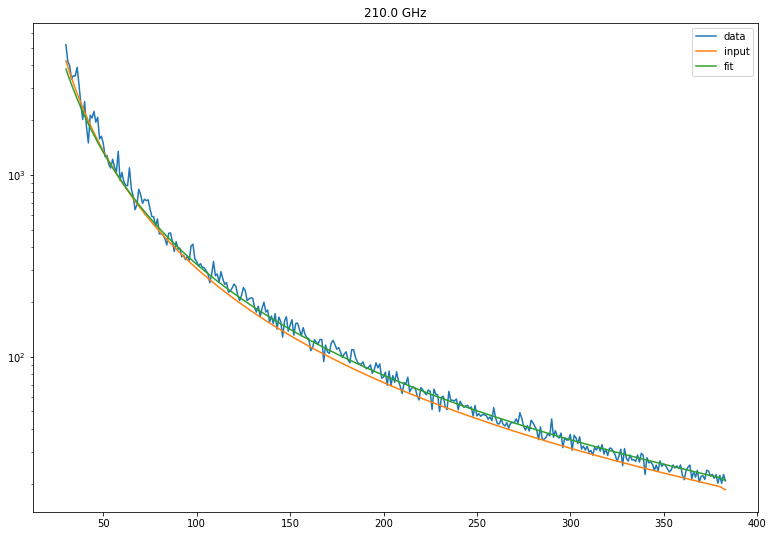

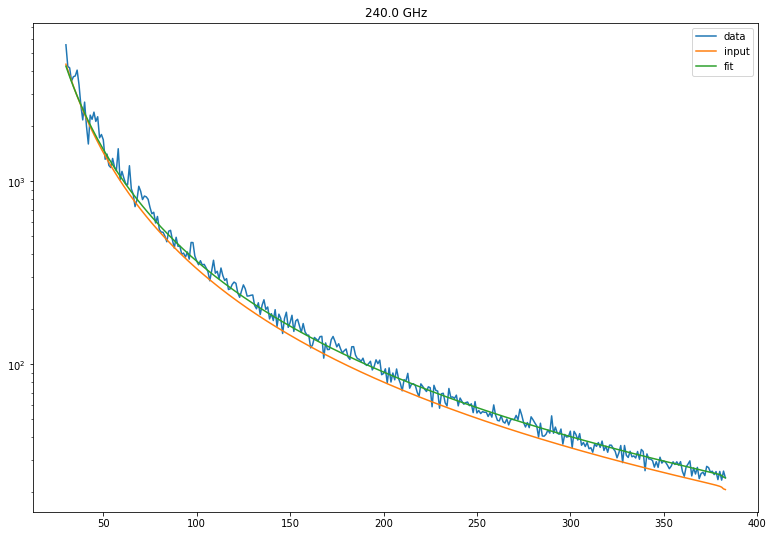

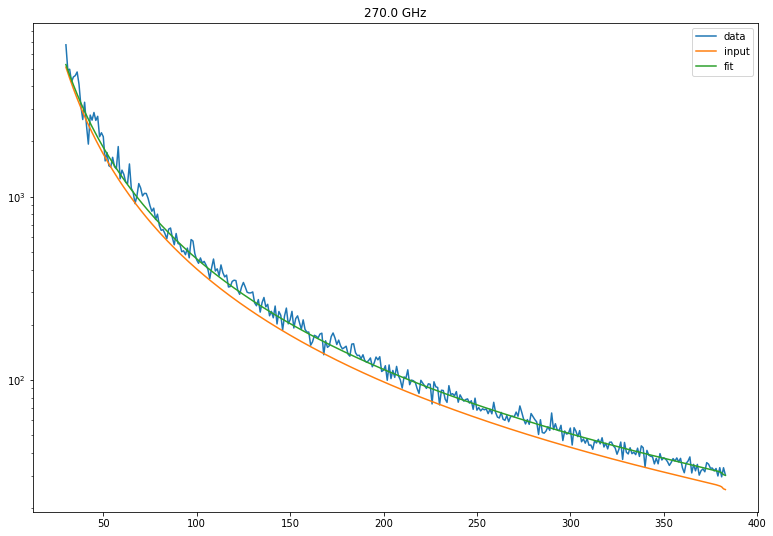

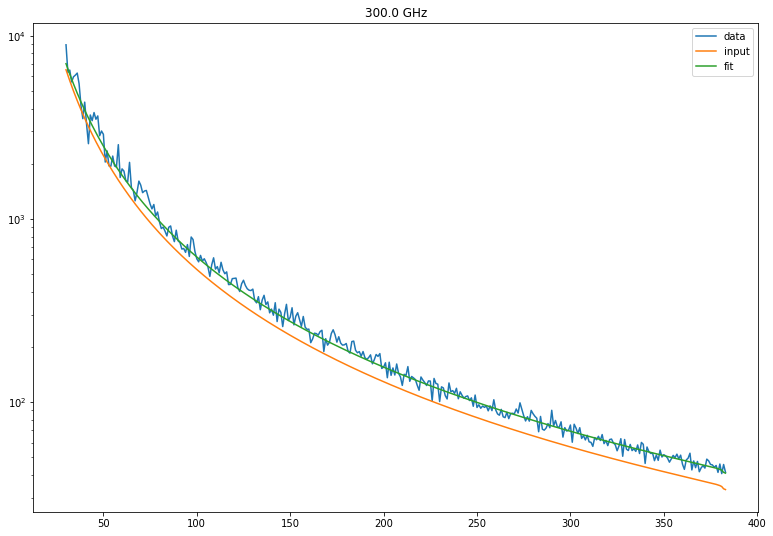

In [183]:
for i in range(len(freqs)):
    figure(figsize=(13,9))
    semilogy(ells[30:], data[i][30:], label='data')
    semilogy(ells[30:], model_fg[i][30:], label='input')
    semilogy(ells[30:], fit1[i][30:], label='fit')
    title(str(np.round(1e-9*freqs[i])) + ' GHz')
    legend()

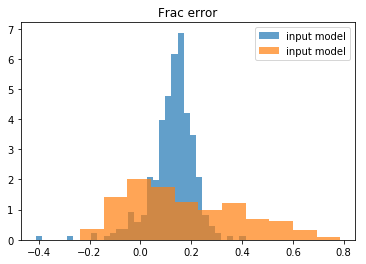

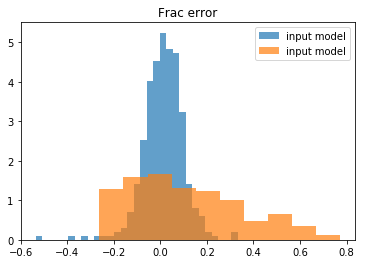

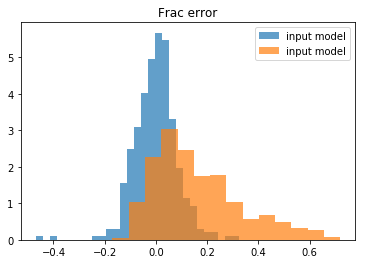

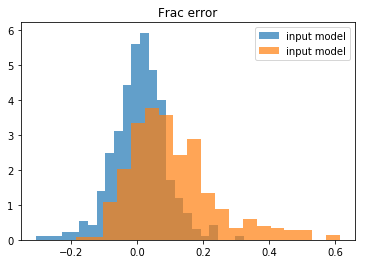

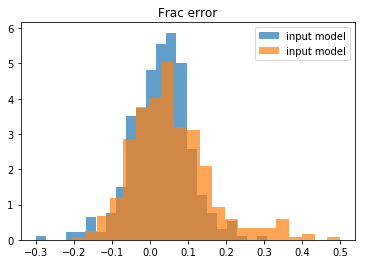

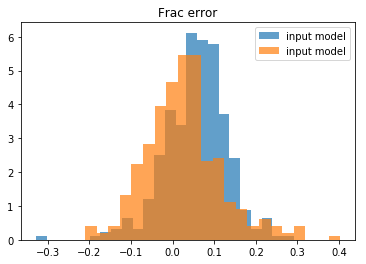

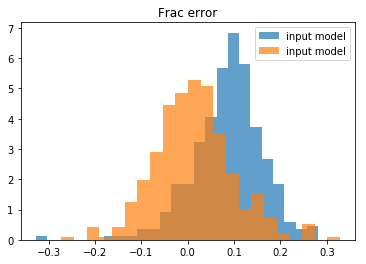

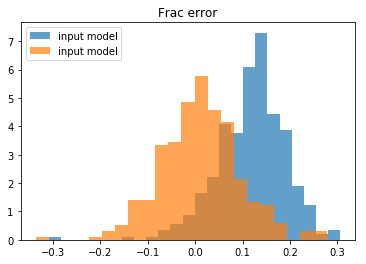

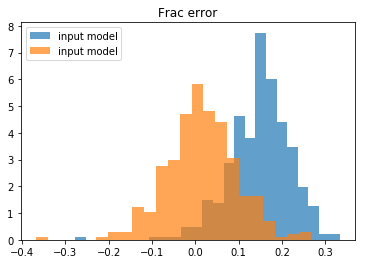

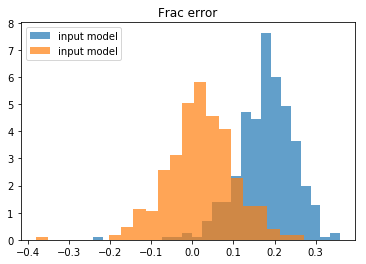

In [186]:
for i in range(len(freqs)):
    figure()
    hist((data[i][30:]-model_fg[i][30:])/data[i][30:], bins='auto', density=True, alpha=0.7, label='input model')
    hist((data[i][30:]-fit1[i][30:])/data[i][30:], bins='auto', density=True, alpha=0.7, label='input model')
    title('Frac error')
    legend()